In [2]:
!pip install uv
!uv pip install kaggle --system
!uv pip install dataprep --system

Using Python 3.10.12 environment at /usr
Audited 1 package in 211ms
Using Python 3.10.12 environment at /usr
Audited 1 package in 214ms


In [3]:
!pip install scipy==1.11.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 27.9 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.13.1
    Uninstalling scipy-1.13.1:
      Successfully uninstalled scipy-1.13.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 1.4.15 requires pydantic>=2.7.0, but you have pydantic 1.10.18 which is incompatible.
mizani 0.11.4 requires pandas>=2.1.0, but you have pandas 1.5.3 which is incompatible.
plotnine 0.13.6 requires pandas<3.0.0,>=2.1.0, but you have pandas 1.5.3 which is incompatible.


In [4]:
import scipy
print(scipy.__version__)

1.11.4


In [5]:
from google.colab import drive
drive.mount('mount')

Mounted at mount


In [6]:
!cp mount/MyDrive/kaggle.json .

In [7]:
!KAGGLE_CONFIG_DIR=$(pwd) kaggle datasets download aayushkandpal/air-quality-time-series-data-uci

Dataset URL: https://www.kaggle.com/datasets/aayushkandpal/air-quality-time-series-data-uci
License(s): CC0-1.0
  0% 0.00/1.23M [00:00<?, ?B/s]
100% 1.23M/1.23M [00:00<00:00, 65.6MB/s]


In [8]:
!unzip -o air-quality-time-series-data-uci.zip

Archive:  air-quality-time-series-data-uci.zip
  inflating: AirQualityUCI.xlsx      


In [9]:
import numpy as np
import pandas as pd
df = pd.read_excel('AirQualityUCI.xlsx')
df

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.00,150,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.600,48.875001,0.757754
1,2004-03-10,19:00:00,2.0,1292.25,112,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.300,47.700000,0.725487
2,2004-03-10,20:00:00,2.2,1402.00,88,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.900,53.975000,0.750239
3,2004-03-10,21:00:00,2.2,1375.50,80,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.000,60.000000,0.786713
4,2004-03-10,22:00:00,1.6,1272.25,51,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.150,59.575001,0.788794
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,2005-04-04,10:00:00,3.1,1314.25,-200,13.529605,1101.25,471.7,538.50,189.8,1374.25,1728.50,21.850,29.250000,0.756824
9353,2005-04-04,11:00:00,2.4,1162.50,-200,11.355157,1027.00,353.3,603.75,179.2,1263.50,1269.00,24.325,23.725000,0.711864
9354,2005-04-04,12:00:00,2.4,1142.00,-200,12.374538,1062.50,293.0,603.25,174.7,1240.75,1092.00,26.900,18.350000,0.640649
9355,2005-04-04,13:00:00,2.1,1002.50,-200,9.547187,960.50,234.5,701.50,155.7,1041.00,769.75,28.325,13.550000,0.513866


Computing normaltest-82c45ae80da9ee30c361fe4df46df7ad:  73%|███████▎  | 2013/2767 [00:01<00:00, 1709.46it/s]                                       /usr/local/lib/python3.10/dist-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))


DataPrep Report
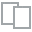
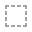
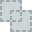
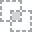
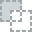
...
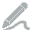
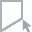
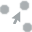
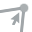
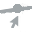

In [10]:
from dataprep.eda import create_report
create_report(df)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           9357 non-null   datetime64[ns]
 1   Time           9357 non-null   object        
 2   CO(GT)         9357 non-null   float64       
 3   PT08.S1(CO)    9357 non-null   float64       
 4   NMHC(GT)       9357 non-null   int64         
 5   C6H6(GT)       9357 non-null   float64       
 6   PT08.S2(NMHC)  9357 non-null   float64       
 7   NOx(GT)        9357 non-null   float64       
 8   PT08.S3(NOx)   9357 non-null   float64       
 9   NO2(GT)        9357 non-null   float64       
 10  PT08.S4(NO2)   9357 non-null   float64       
 11  PT08.S5(O3)    9357 non-null   float64       
 12  T              9357 non-null   float64       
 13  RH             9357 non-null   float64       
 14  AH             9357 non-null   float64       
dtypes: datetime64[ns](1),

<h2>Data Preprocessing and Cleaning</h2>

In [12]:
df.drop(columns = ['NMHC(GT)', 'NO2(GT)'], inplace = True)

In [37]:
for index, value in df['Date'].iteritems():
    df['Date'][index] = df['Date'][index].replace(hour=df['Time'][index].hour)

df.drop('Time', axis=1, inplace=True)

df.head()

<ipython-input-37-1ef75ac2eb49>:1: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, value in df['Date'].iteritems():
<ipython-input-37-1ef75ac2eb49>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date'][index] = df['Date'][index].replace(hour=df['Time'][index].hour)


,Date,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10 18:00:00,0.580248,1.172176,0.527704,0.382378,0.688266,0.577077,13.60,48.875001,0.757754
1,2004-03-10 19:00:00,0.165291,0.863643,0.218965,0.045730,0.304712,-0.141496,13.30,47.700000,0.725487
2,2004-03-10 20:00:00,0.312178,1.363443,0.162532,-0.011770,0.292479,0.106141,11.90,53.975000,0.750239
3,2004-03-10 21:00:00,0.312178,1.242763,0.195442,0.021617,0.376673,0.420706,11.00,60.000000,0.786713
4,2004-03-10 22:00:00,-0.160402,0.772564,-0.248162,-0.396644,0.106818,0.193757,11.15,59.575001,0.788794


In [13]:
# -200 is the dummy value that represents a missing value
# We impute it with the last seen value (in the previous index)
def impute_missing_time_series_values(df_column):
    for index, value in df_column.iteritems():
        if value == -200:
            df_column[index] = df_column[index - 1]

for column_name in df.columns.tolist():
    impute_missing_time_series_values(df[column_name])

df

<ipython-input-13-72345675c24c>:4: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, value in df_column.iteritems():
<ipython-input-13-72345675c24c>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_column[index] = df_column[index - 1]


,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.00,11.881723,1045.50,166.0,1056.25,1692.00,1267.50,13.600,48.875001,0.757754
1,2004-03-10,19:00:00,2.0,1292.25,9.397165,954.75,103.0,1173.75,1558.75,972.25,13.300,47.700000,0.725487
2,2004-03-10,20:00:00,2.2,1402.00,8.997817,939.25,131.0,1140.00,1554.50,1074.00,11.900,53.975000,0.750239
3,2004-03-10,21:00:00,2.2,1375.50,9.228796,948.25,172.0,1092.00,1583.75,1203.25,11.000,60.000000,0.786713
4,2004-03-10,22:00:00,1.6,1272.25,6.518224,835.50,131.0,1205.00,1490.00,1110.00,11.150,59.575001,0.788794
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,2005-04-04,10:00:00,3.1,1314.25,13.529605,1101.25,471.7,538.50,1374.25,1728.50,21.850,29.250000,0.756824
9353,2005-04-04,11:00:00,2.4,1162.50,11.355157,1027.00,353.3,603.75,1263.50,1269.00,24.325,23.725000,0.711864
9354,2005-04-04,12:00:00,2.4,1142.00,12.374538,1062.50,293.0,603.25,1240.75,1092.00,26.900,18.350000,0.640649
9355,2005-04-04,13:00:00,2.1,1002.50,9.547187,960.50,234.5,701.50,1041.00,769.75,28.325,13.550000,0.513866


Computing sum-aggregate-5b01a055f85265bbedb7d7c568471132:  78%|███████▊  | 1815/2329 [00:01<00:00, 1600.60it/s]/usr/local/lib/python3.10/dist-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))


DataPrep Report
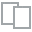
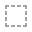
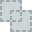
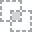
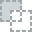
...
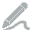
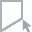
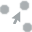
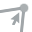
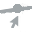

In [14]:
from dataprep.eda import create_report
create_report(df)

In [15]:
df['NOx(GT)'] = np.log1p(df['NOx(GT)'])
df['C6H6(GT)'] = np.log1p(df['C6H6(GT)'])
df['CO(GT)'] = np.log1p(df['CO(GT)'])

In [16]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

numerical_columns = ['CO(GT)', 'PT08.S5(O3)', 'PT08.S4(NO2)', 'NOx(GT)', 'PT08.S3(NOx)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'PT08.S1(CO)']

df[numerical_columns] = scaler.fit_transform(df[numerical_columns])

Computing normaltest-b2796b1a545af4d75bf843bceb79d933:  75%|███████▍  | 1746/2329 [00:01<00:00, 1628.77it/s]                     /usr/local/lib/python3.10/dist-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))


DataPrep Report
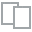
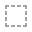
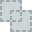
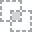
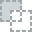
...
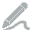
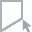
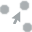
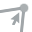
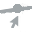

In [17]:
from dataprep.eda import create_report
create_report(df)

<h2>Anomaly Elimination via Clustering</h2>

In [21]:
from sklearn.cluster import KMeans

features = numerical_columns + ["T", "RH", "AH"]
df_features = df[features]

kmeans = KMeans(n_clusters=5, random_state=42)
cluster = kmeans.fit_predict(df_features)

# Calculate the distance of each point to its assigned cluster centroid
distance_to_centroid = np.linalg.norm(df_features - kmeans.cluster_centers_[cluster], axis=1)

# Set a threshold for outliers (e.g., points in the 95th percentile of distance from centroids)
outlier_threshold = np.percentile(distance_to_centroid, 95)

# Identify outliers as those points with a distance to centroid greater than the threshold
df['is_outlier'] = distance_to_centroid > outlier_threshold

num_outliers = df['is_outlier'].sum()

print("Number of outliers identified:", num_outliers)
print(df['is_outlier'].value_counts())

Number of outliers identified: 468
False    8889
True      468
Name: is_outlier, dtype: int64


In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           9357 non-null   datetime64[ns]
 1   Time           9357 non-null   object        
 2   CO(GT)         9357 non-null   float64       
 3   PT08.S1(CO)    9357 non-null   float64       
 4   C6H6(GT)       9357 non-null   float64       
 5   PT08.S2(NMHC)  9357 non-null   float64       
 6   NOx(GT)        9357 non-null   float64       
 7   PT08.S3(NOx)   9357 non-null   float64       
 8   PT08.S4(NO2)   9357 non-null   float64       
 9   PT08.S5(O3)    9357 non-null   float64       
 10  T              9357 non-null   float64       
 11  RH             9357 non-null   float64       
 12  AH             9357 non-null   float64       
 13  is_outlier     9357 non-null   bool          
dtypes: bool(1), datetime64[ns](1), float64(11), object(1)
memory usage: 959.

In [23]:
df.drop(df[df['is_outlier'] == True].index, inplace=True)
df.drop('is_outlier', axis=1, inplace=True)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8889 entries, 0 to 9356
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           8889 non-null   datetime64[ns]
 1   Time           8889 non-null   object        
 2   CO(GT)         8889 non-null   float64       
 3   PT08.S1(CO)    8889 non-null   float64       
 4   C6H6(GT)       8889 non-null   float64       
 5   PT08.S2(NMHC)  8889 non-null   float64       
 6   NOx(GT)        8889 non-null   float64       
 7   PT08.S3(NOx)   8889 non-null   float64       
 8   PT08.S4(NO2)   8889 non-null   float64       
 9   PT08.S5(O3)    8889 non-null   float64       
 10  T              8889 non-null   float64       
 11  RH             8889 non-null   float64       
 12  AH             8889 non-null   float64       
dtypes: datetime64[ns](1), float64(11), object(1)
memory usage: 972.2+ KB


<h2>Feature Processing/Selection</h2>

In [25]:
df.corr()

<ipython-input-25-2f6f6606aa2c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.770665,0.774829,0.782202,0.763538,-0.662564,0.519372,0.747747,0.006864,0.017498,0.002364
PT08.S1(CO),0.770665,1.000000,0.868932,0.894606,0.663173,-0.774264,0.668645,0.900778,0.007908,0.103847,0.082163
C6H6(GT),0.774829,0.868932,1.000000,0.978707,0.652147,-0.831897,0.754610,0.854475,0.240064,-0.119287,0.162898
PT08.S2(NMHC),0.782202,0.894606,0.978707,1.000000,0.645998,-0.794470,0.772217,0.874487,0.206740,-0.095866,0.146846
NOx(GT),0.763538,0.663173,0.652147,0.645998,1.000000,-0.694095,0.181992,0.721492,-0.255439,0.166565,-0.181879
PT08.S3(NOx),-0.662564,-0.774264,-0.831897,-0.794470,-0.694095,1.000000,-0.527230,-0.793475,-0.110372,-0.055057,-0.198214
PT08.S4(NO2),0.519372,0.668645,0.754610,0.772217,0.181992,-0.527230,1.000000,0.567572,0.544026,-0.067440,0.593392
PT08.S5(O3),0.747747,0.900778,0.854475,0.874487,0.721492,-0.793475,0.567572,1.000000,-0.075594,0.125829,0.017491
T,0.006864,0.007908,0.240064,0.206740,-0.255439,-0.110372,0.544026,-0.075594,1.000000,-0.605245,0.659776
RH,0.017498,0.103847,-0.119287,-0.095866,0.166565,-0.055057,-0.067440,0.125829,-0.605245,1.000000,0.137507


In [26]:
df.drop('NOx(GT)', axis=1, inplace=True)
df.drop('PT08.S3(NOx)', axis=1, inplace=True)

<h2>AutoViML</h2>

In [28]:
!uv pip install auto-ts --system

Using Python 3.10.12 environment at /usr
Resolved 143 packages in 1.78s
Building gputil==1.4.0
Building gputil==1.4.0
⠙ Preparing packages... (0/30)
Building gputil==1.4.0
⠙ Preparing packages... (0/30)
Building gputil==1.4.0
⠙ Preparing packages... (0/30)
jupyter-events ------------------------------     0 B/18.34 KiB
Building gputil==1.4.0
⠙ Preparing packages... (0/30)
jupyter-events ------------------------------ 14.91 KiB/18.34 KiB
Building gputil==1.4.0
⠙ Preparing packages... (0/30)
jupyter-server-terminals ------------------------------     0 B/13.34 KiB
jupyter-events ------------------------------ 14.91 KiB/18.34 KiB
Building gputil==1.4.0
⠙ Preparing packages... (0/30)
jupyter-server-terminals ------------------------------ 13.34 KiB/13.34 KiB
jupyter-events ------------------------------ 14.91 KiB/18.34 KiB
Building gputil==1.4.0
⠙ Preparing packages... (0/30)
tblib      ------------------------------     0 B/12.19 KiB
jupyter-server-terminals ------------------------------

Start of Fit.....
    Target variable given as = T
Start of loading of data.....
    Inputs: ts_column = Date, sep = ,, target = ['T']
    Using given input: pandas dataframe...
    Date column exists in given train data...
    train data shape = (8889, 9)
Alert: Could not detect strf_time_format of Date. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------------------+
|        Test Statistic       |     -3.1429823246318875      |
|           p-value           |     0.023531544164376545     |
|          #Lags Used         |             24.0             |
| Number of Observations Used |            8864.0            |
|     Critical Value (1%)     |     -3.4310879506699474

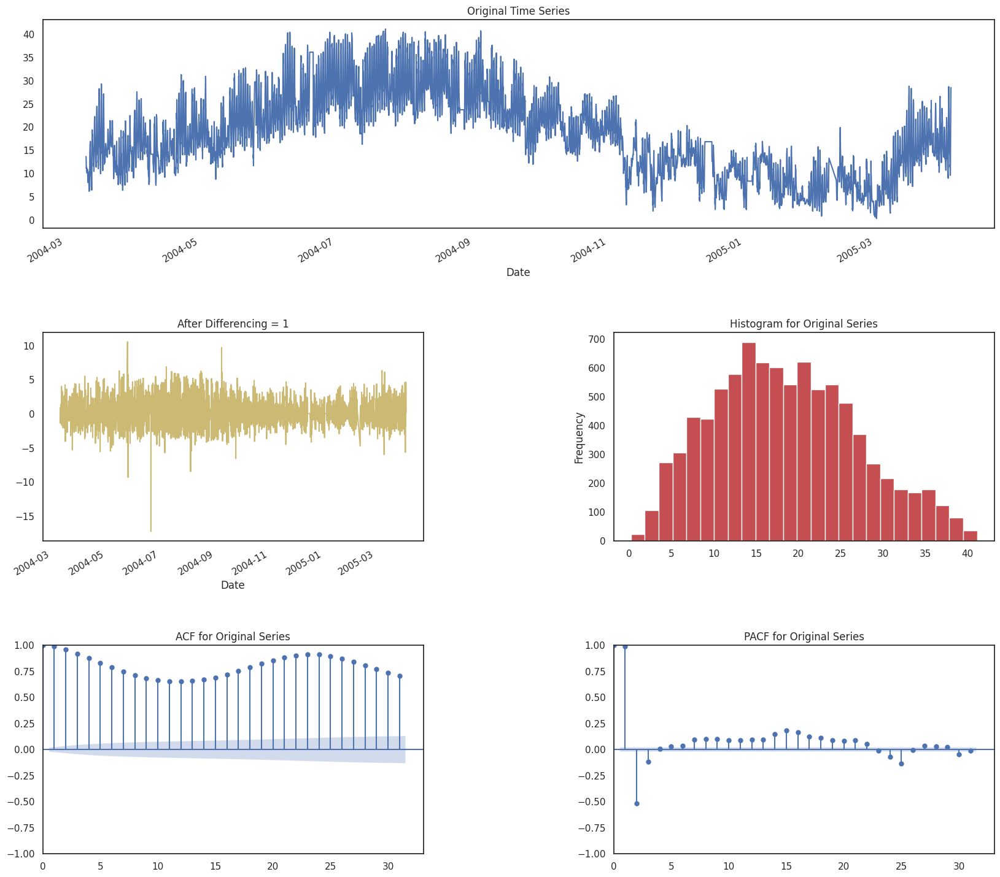

Time Interval is given as H
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...


DEBUG:cmdstanpy:input tempfile: /tmp/tmplaaszjil/p4sc0gui.json


kwargs for Prophet model: {'iter': 100}
    Fit-Predict data (shape=(8889, 10)) with Confidence Interval = 0.95...
  Starting Prophet Fit
      No seasonality assumed since seasonality flag is set to False
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 8864 Test Shape: 5


DEBUG:cmdstanpy:input tempfile: /tmp/tmplaaszjil/btp120je.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19607', 'data', 'file=/tmp/tmplaaszjil/p4sc0gui.json', 'init=/tmp/tmplaaszjil/btp120je.json', 'output', 'file=/tmp/tmplaaszjil/prophet_modelaek9551k/prophet_model-20241028103903.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=100']
10:39:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:39:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmplaaszjil/t9rxrr5_.json


    RMSE = 9.08
    Std Deviation of actuals = 2.35
    Normalized RMSE (as pct of std dev) = 386%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 8869 Test Shape: 5


DEBUG:cmdstanpy:input tempfile: /tmp/tmplaaszjil/xf5u7dte.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53546', 'data', 'file=/tmp/tmplaaszjil/t9rxrr5_.json', 'init=/tmp/tmplaaszjil/xf5u7dte.json', 'output', 'file=/tmp/tmplaaszjil/prophet_modelo07_vlp9/prophet_model-20241028103906.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=100']
10:39:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:39:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmplaaszjil/z94ukqcs.json


    RMSE = 3.44
    Std Deviation of actuals = 1.92
    Normalized RMSE (as pct of std dev) = 179%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 8874 Test Shape: 5


DEBUG:cmdstanpy:input tempfile: /tmp/tmplaaszjil/oxcgu4w9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10962', 'data', 'file=/tmp/tmplaaszjil/z94ukqcs.json', 'init=/tmp/tmplaaszjil/oxcgu4w9.json', 'output', 'file=/tmp/tmplaaszjil/prophet_model8vozdnpo/prophet_model-20241028103908.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=100']
10:39:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:39:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


    RMSE = 2.29
    Std Deviation of actuals = 1.14
    Normalized RMSE (as pct of std dev) = 201%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 8879 Test Shape: 5


DEBUG:cmdstanpy:input tempfile: /tmp/tmplaaszjil/htpoci25.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplaaszjil/zjvmlyo5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33881', 'data', 'file=/tmp/tmplaaszjil/htpoci25.json', 'init=/tmp/tmplaaszjil/zjvmlyo5.json', 'output', 'file=/tmp/tmplaaszjil/prophet_modelltqalxlt/prophet_model-20241028103912.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=100']
10:39:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:39:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmplaaszjil/m9qoxjej.json


    RMSE = 2.96
    Std Deviation of actuals = 3.28
    Normalized RMSE (as pct of std dev) = 90%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 8884 Test Shape: 5


DEBUG:cmdstanpy:input tempfile: /tmp/tmplaaszjil/srts32ld.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22754', 'data', 'file=/tmp/tmplaaszjil/m9qoxjej.json', 'init=/tmp/tmplaaszjil/srts32ld.json', 'output', 'file=/tmp/tmplaaszjil/prophet_modelztkogie5/prophet_model-20241028103916.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=100']
10:39:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:39:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


    RMSE = 9.54
    Std Deviation of actuals = 2.55
    Normalized RMSE (as pct of std dev) = 374%
Cross Validation window: 5 completed


DEBUG:cmdstanpy:input tempfile: /tmp/tmplaaszjil/uy25t8o3.json



-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 5.15
    MSE (Mean Squared Error = 39.84
    MAPE (Mean Absolute Percent Error) = 24%
    RMSE (Root Mean Squared Error) = 6.3121
    Normalized RMSE (MinMax) = 33%
    Normalized RMSE (as Std Dev of Actuals)= 94%
Time Taken = 15 seconds


DEBUG:cmdstanpy:input tempfile: /tmp/tmplaaszjil/5ke6u8vn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77354', 'data', 'file=/tmp/tmplaaszjil/uy25t8o3.json', 'init=/tmp/tmplaaszjil/5ke6u8vn.json', 'output', 'file=/tmp/tmplaaszjil/prophet_modellgm50def/prophet_model-20241028103919.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=100']
10:39:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:39:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 5.46


--------------------------------------------------
Total time taken: 22 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name      rmse
0  Prophet  5.461128


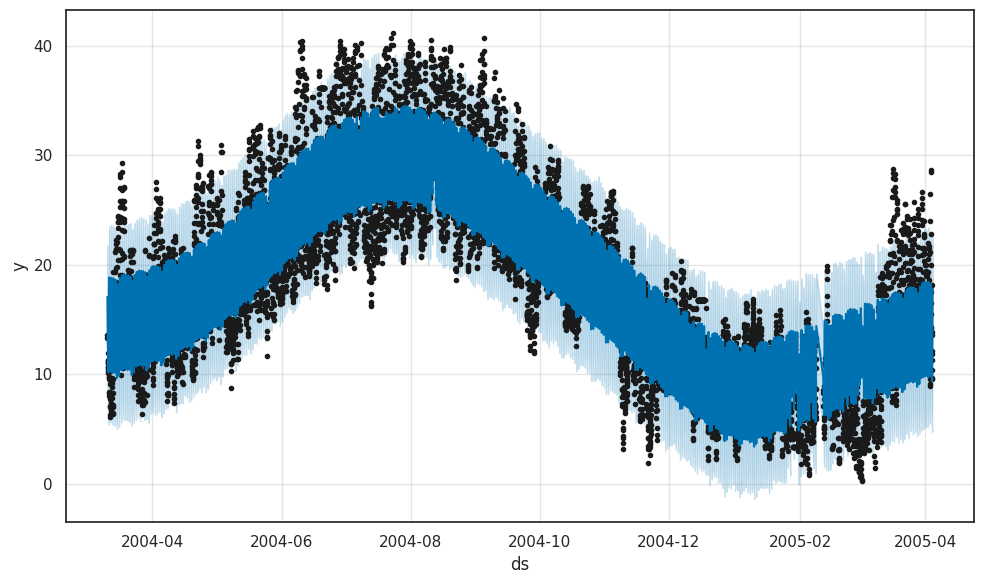

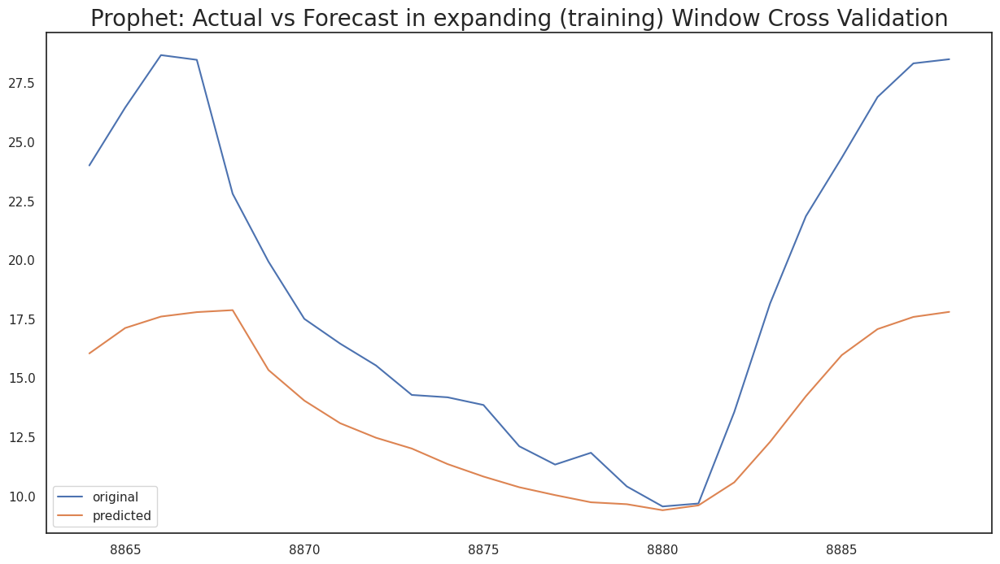

In [40]:
from auto_ts import auto_timeseries

# Optionally, reset the index of the sampled DataFrame
# df.reset_index(drop=True, inplace=True)

model = auto_timeseries(
    score_type='rmse',
    time_interval='H',
    non_seasonal_pdq=None, seasonality=False,
    seasonal_period=12,
    model_type=['Prophet'],
    verbose=2,
)

# Define your dataset
train = df         # Features
target = 'T'       # Target



# Initialize AutoViML for automated modeling and feature selection
model.fit(
    traindata=train,
    ts_column='Date',
    target=target,
    cv=5,
    sep=","
)